In [2]:
from tkinter import N
from turtle import title
import requests
from bs4 import BeautifulSoup

categories =['bisnis', 'hak-asasi-manusia','ilmu-hukum','kekayaan-intelektual','keluarga', 'ketenagakerjaan','perdata','perlindungan-kosumen','pertanahan-properti','pidana','profesi-hukum','start-up-umkm','teknologi']
# categories =['bisnis', 'hak-asasi-manusia','ilmu-hukum']#'kekayaan-intelektual','keluarga', 'ketenagakerjaan','perdata','perlindungan-kosumen','pertanahan-properti','pidana','profesi-hukum','start-up-umkm','teknologi']
kolom1 = []
kolom2 = []
kolom3 = []
kolom4 = []
kolom5 = []
kolom6 = []
kolom7= []
kolom8= []
nomor = [] 
k=1

for j in range(len(categories)):

  for i in range(5):#pengulangan 5 kali halaman setiap kategory
    url = 'https://www.hukumonline.com/klinik/'+categories[j]+'/page/'+str(i)+'/'
    
    #Membuat Requests
    r = requests.get(url)

    #Hasil Response
    request = r.content
    soup = BeautifulSoup(request, 'html.parser')

    #Extract Element
    category = soup.findAll('span', attrs={'class':'d-inline-flex flex-row justify-content-center align-items-center mx-2 badge badge-primary badge-pill'})
    title = soup.findAll('h2', attrs={'class':'header-6 font-weight-bold text-dark'})
    date = soup.findAll('span',attrs={ 'class':'small text-muted mr-1'})
    mitra_author = soup.findAll('a',attrs={'class':"small mx-2 d-none d-md-inline-block"})
    
    #crawling link
    temp =[]
    for a in soup.find_all('a', href=True):
      if 'href' in a.attrs:
        temp.append(a.attrs['href']) #menambahkan link ke kolom7
        # print("Found the URL:", a.attrs['href'])
    
    #menambahkan setiap konten ke kolom masing
    count = 0

    #menambahkan kolom1,kolom2,kolom4,kolom6 dan nomor
    for x in range(0, len(title)):
      count += 1
      kolom1.append(title[x].text.strip())
      kolom2.append(date[x].text.strip())
      kolom4.append(category[x].text.strip())

      #melakukan transformasi pada tanggal
      kolom6.append(date[0].text.strip().split()[2])
      nomor.append(str(k))
      k=k+1

    #menambahkan kolom link (kolom7)
    for link in range(24,len(temp)-47,4):
      kolom7.append('https://www.hukumonline.com'+temp[link]) #menambahkan kolom7
      url2 = 'https://www.hukumonline.com'+temp[link]
      print(url2)
       #Membuat Requests
      r2 = requests.get(url2)

      #Hasil Response
      request2 = r2.content
      soup1 = BeautifulSoup(request2, 'html.parser')
      #extract article
      artikel = soup1.find_all('article',attrs={'class':'undefined article-content-container'})
      tagP=artikel[0].find_all('p')
      text =""
      for p in tagP:
        for i in p.text.strip().split():
          text = text + str(i) + " "
      print(text)
      kolom8.append(text)#menambahkan kolom8

    #menambahkan kolom3 dan kolom4
    for y in range(0,len(mitra_author)-1,2):
      kolom3.append(mitra_author[y].text.strip())#menambahkan kolom3
      kolom5.append(mitra_author[y+1].text.strip())#menambahkan kolom5
      # print("{0}. {1}\n  {2}  \n{3}".format(y,mitra_author[y].text.strip(),mitra_author[y+1].text.strip(),category[x].text.strip()))
      y=y+2
    
    

https://www.hukumonline.com/klinik/detail/lt632c3fb17fb2c/izin-usaha-industri-untuk-pemurnian-mineral-logam
Seluruh informasi hukum yang ada di Klinik hukumonline.com disiapkan semata – mata untuk tujuan pendidikan dan bersifat umum (lihat Pernyataan Penyangkalan selengkapnya). Untuk mendapatkan nasihat hukum spesifik terhadap kasus Anda, konsultasikan langsung dengan Konsultan Mitra Justika. Pemurnian merupakan bagian dari tahapan operasi produksi dalam kegiatan usaha pertambangan untuk meningkatkan mutu komoditas mineral melalui serangkaian proses fisika dan kimia untuk menghasilkan produk yang berbeda dari komoditas tambang asalnya sampai dengan produk logam sebagai bahan baku industri.[1] Pada dasarnya pemegang IUP dan IUPK wajib melakukan pengolahan dan/atau pemurnian untuk meningkatkan nilai tambah mineral hasil penambangan dalam negeri yang dilakukan sendiri atau bekerja sama dengan:[2] Untuk menyederhanakan jawaban, kami asumsikan bahwa perusahaan Anda merupakan perusahaan pert

In [3]:
#MEMBUAT NAMA FIELD
import numpy as np
data = {'No':nomor,
        'judul_artikel': kolom1,
        'update': kolom2,
        'mitra':kolom3,
        'kategory':kolom4,
        'author':kolom5,
        'tahun' :kolom6,
        'link' :kolom7,
        'isi' :kolom8
       }

In [4]:
#membuat dataframe
import pandas as pd
df_hasil = pd.DataFrame(data)

In [5]:
#menyetel index pada field no
df_hasil = df_hasil.set_index('No')
df_hasil.head(12)

,judul_artikel,update,mitra,kategory,author,tahun,link,isi
No,,,,,,,,
1,Izin Usaha Industri untuk Pemurnian Mineral Logam,22 Sep 2022,Si Pokrol,Bisnis,"Nafiatul Munawaroh, S.H., M.H",2022,https://www.hukumonline.com/klinik/detail/lt63...,Seluruh informasi hukum yang ada di Klinik huk...
2,"Gadai Saham: Ketentuan, Syarat dan Hak Pemegan...",22 Sep 2022,Pusat Kajian Hukum Bisnis FH Unair,Bisnis,"Yuniarti, S.H., M.H. , LL.M",2022,https://www.hukumonline.com/klinik/detail/cl38...,Seluruh informasi hukum yang ada di Klinik huk...
3,Aturan Pengalihan Saham Perusahaan Tambang Tem...,22 Sep 2022,Si Pokrol,Bisnis,"David Christian, S.H.",2022,https://www.hukumonline.com/klinik/detail/lt63...,Seluruh informasi hukum yang ada di Klinik huk...
4,"Konversi Utang Jadi Setoran Saham, Ini Caranya",14 Sep 2022,DSLC,Bisnis,"Rizky Dwinanto, S.H., M.H., M.M.",2022,https://www.hukumonline.com/klinik/detail/lt63...,Dari pertanyaan yang Anda ajukan pada pokoknya...
5,"Tanpa NDA, Bisakah Karyawan Digugat Pelanggara...",13 Sep 2022,Tjoetiar Tandjung & Associates,Bisnis,"Syafrida Tandjung, S.H., LL.M",2022,https://www.hukumonline.com/klinik/detail/lt63...,Seluruh informasi hukum yang ada di Klinik huk...
6,Langkah Jika Mantan Karyawan Membocorkan Rahas...,09 Sep 2022,Si Pokrol,Bisnis,"Bernadetha Aurelia Oktavira, S.H.",2022,https://www.hukumonline.com/klinik/detail/lt61...,Artikel di bawah ini adalah pemutakhiran dari ...
7,"Pinjaman Melebihi Modal Dasar PT, Perlukah Per...",08 Sep 2022,Tjoetiar Tandjung & Associates,Bisnis,"Syafrida Tandjung, S.H., LL.M",2022,https://www.hukumonline.com/klinik/detail/lt62...,Seluruh informasi hukum yang ada di Klinik huk...
8,Persamaan Asosiasi dengan Perkumpulan dan Pros...,06 Sep 2022,Si Pokrol,Bisnis,"David Christian, S.H.",2022,https://www.hukumonline.com/klinik/detail/lt63...,Seluruh informasi hukum yang ada di Klinik huk...
9,7 Alasan Mengapa Investor Asing Berinvestasi d...,01 Sep 2022,Si Pokrol,Bisnis,"David Christian, S.H.",2022,https://www.hukumonline.com/klinik/detail/lt63...,Seluruh informasi hukum yang ada di Klinik huk...


In [14]:
# updated_df = df
df['isi']=df['isi'].fillna("kosong")

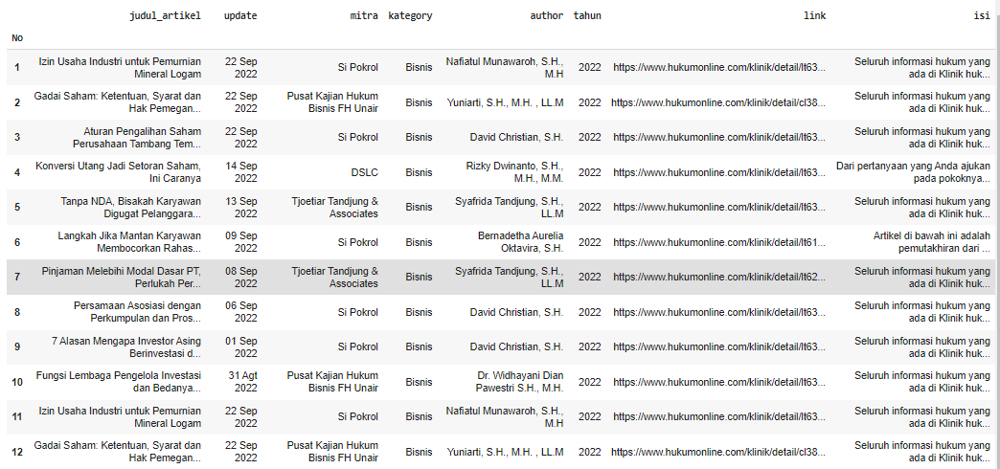

In [18]:
#import ke format csv
df_hasil.to_csv('hasil-crawling_scrapping-web-hukumOnline-pidana-update.csv')

Preprosessing and Tokenizing

In [3]:
import pandas as pd
df = pd.read_csv('hasil-crawling_scrapping-web-hukumOnline-pidana-update.csv')

In [4]:
# updated_df = df
df['isi']=df['isi'].fillna("kosong")

In [5]:
#mengambil isi artikel sebagai dokumen
array = [] #dipake untuk mengambil dokumen

#menhitung berapa baris dalam csv
read =df['isi']
# print(read[95]+"pppp")
baris = 1
for word in read:
    if word == '\n': break
    baris += 1
print("jumlah baris dalam file: ", str(baris))
read = ""
for i in range(baris-1):
  array.append(df['isi'][i])
  # print(i)
  read = read + df['isi'][i] +' \n'

jumlah baris dalam file:  601


In [6]:
import re #modul regular expression
import string
punc = '''!()-[]{};:'"\, <>./?@#$%^&*_~''' #preprocessing
for ele in read:  
    if ele in punc:  
        read = read.replace(ele, " ")  

#menghilangkan angka
read = re.sub(r"\d+","",read)

In [7]:
#harus seragam menjadi huruf kecil semuanya
read=read.lower()  

In [8]:
from nltk.tokenize import word_tokenize
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
  

listStopword = set(stopwords.words('indonesian'))

for i in range(1):
    # this will convert
    # the word into tokens
    text_tokens = word_tokenize(read)
  
tokens_without_sw = [
    word for word in text_tokens if not word in listStopword]
  
print(tokens_without_sw)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


['informasi', 'hukum', 'klinik', 'hukumonline', 'com', 'disiapkan', '–', 'mata', 'tujuan', 'pendidikan', 'bersifat', 'lihat', 'pernyataan', 'penyangkalan', 'selengkapnya', 'nasihat', 'hukum', 'spesifik', 'konsultasikan', 'langsung', 'konsultan', 'mitra', 'justika', 'pemurnian', 'tahapan', 'operasi', 'produksi', 'kegiatan', 'usaha', 'pertambangan', 'meningkatkan', 'mutu', 'komoditas', 'mineral', 'serangkaian', 'proses', 'fisika', 'kimia', 'menghasilkan', 'produk', 'berbeda', 'komoditas', 'tambang', 'asalnya', 'produk', 'logam', 'bahan', 'baku', 'industri', 'dasarnya', 'pemegang', 'iup', 'iupk', 'wajib', 'pengolahan', 'pemurnian', 'meningkatkan', 'nilai', 'mineral', 'hasil', 'penambangan', 'negeri', 'menyederhanakan', 'asumsikan', 'perusahaan', 'perusahaan', 'pertambangan', 'kegiatan', 'operasi', 'produksi', 'kegiatan', 'penambangan', 'iup', 'perusahaan', 'pemurnian', 'maksud', 'asumsikan', 'melaksanakan', 'kegiatan', 'pemurnian', 'terintegrasi', 'kegiatan', 'penambangan', 'pemegang', 'i

In [9]:
dict = {}
  
for i in range(baris-1):
    check = array[i].lower()
    for item in tokens_without_sw:
  
        if item in check:
            if item not in dict:
                dict[item] = []
  
            if item in dict:
                dict[item].append(i+1)

In [23]:
for key in dict:
  print(key, '->', dict[key])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ajar -> [1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 27, 29, 29, 29, 29, 29, 29, 30, 30, 30, 30, 30, 30, 33, 33, 33, 33, 33, 33, 36, 36, 36, 36, 36, 36, 39, 39, 39, 39, 39, 39, 41, 41, 41, 41, 41, 41, 44, 44, 44, 44, 44, 44, 46, 46, 46, 46, 46, 46, 49, 49, 49, 49, 49, 49, 53, 53, 53, 53, 53, 53, 55, 55, 55, 55, 55, 55, 57, 57, 57, 57, 57, 57, 58, 58, 58, 58, 58, 58, 59, 59, 59, 59, 59, 59, 60, 60, 60, 60, 60, 60, 63, 63, 63, 63, 63, 63, 65, 65, 65, 65, 65, 65, 67, 67, 67, 67, 67, 67, 68, 68, 68, 68, 68, 68, 69, 69, 69, 69, 69, 69, 70, 70, 70, 70, 70, 70, 72, 72, 72, 72, 72, 72, 78, 78, 78, 78, 78, 78, 84, 84, 84, 84, 84, 84, 86, 86, 86, 8

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



-> [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 33, 33

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




eksplisit -> [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 76, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 95, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 103, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113, 234, 234, 234, 234, 234, 234, 234, 234, 234, 234, 234, 234, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
obsesi -> [130]
seluas -> [130, 130, 130, 130, 130, 130, 130, 130, 130, 132, 132, 132, 132, 132, 132, 132, 132, 132, 349, 349, 349, 349, 349, 349, 349, 349, 349, 359, 359, 359, 359, 359, 359, 359, 359, 359, 369, 369, 369, 369, 369, 369, 369, 369, 369, 543, 543, 543, 543, 543, 543, 543, 543, 543, 545, 545, 545, 545, 545, 545, 545, 545, 545, 574, 574, 574, 574, 574, 574, 574, 574, 574]
melancarkan -> [130, 130, 130, 150, 150, 150, 398, 398, 398]
direncanakan -> [130, 130, 130, 130, 273, 273, 273, 273, 371, 371, 371, 371]
kontemporer -> [130, 130, 130, 202, 202, 202, 212, 212, 212]
normal -> [130, 130, 130, 130, 130, 130, 231, 231, 231, 231, 231, 231, 296, 296, 296, 296, 296, 296, 427, 427, 427, 427, 427, 427, 471, 471, 471, 471, 471, 471]
berkutat -> [130]
uupa -> [130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 130, 351, 

In [10]:
import csv
new_path = open("mytest.csv", "w")

z = csv.writer(new_path)
for new_k, new_v in dict.items():
    z.writerow([new_k, new_v])

new_path.close()

Kompresi Index

In [11]:
s = dict
d = {}
x = []

# menghitung jumlah value pada setiap key
for i in s:
    # print(i)
    count=0
    for key in i:
      count = count +1 #menghitung frequency list
    d[i] = count #value

for key,value in d.items():#copy ke bentuk list
    x.append(key)
    x.append(value)
try:
  for i in x[1:len(x):2]:
      x[i] = str(x[i])

  hasil = ''.join(map(str, x))
except:
  print("berhasil")

In [12]:
with open('hasilCompressing.txt', 'w') as f:
    f.write(hasil)